<a href="https://colab.research.google.com/github/Saharsh2k5/ML_ASSIGNMENT_2/blob/main/Task_4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Task 4 :
1) Pick an image of your liking and reconstruct it using matrix factorization. Choose a suitable value for the rank
r
. Run Gradient Descent until it converges, plot the reconstructed image alongside the original image. Calculate and report the RMSE and PSNR metrics.

Convergence reached at iteration 357


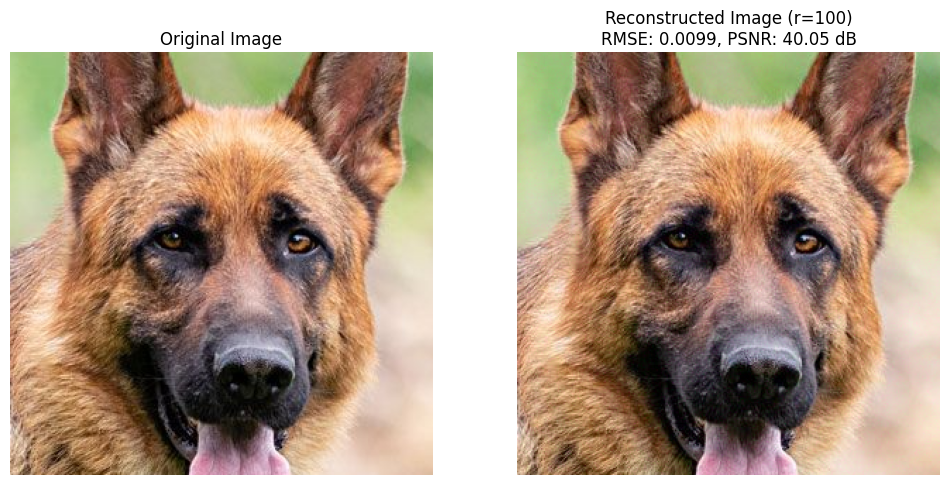

Final RMSE: 0.0099
Final PSNR: 40.05 dB


In [ ]:
import torch
import torchvision.transforms.functional as TF
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import requests
from io import BytesIO

# Function to load and preprocess the image
def load_image(image_path):
    response = requests.get(image_path)
    img = Image.open(BytesIO(response.content)).convert('RGB')
    img = np.array(img) / 255.0  # Normalize pixel values to [0, 1]
    img_tensor = torch.tensor(img, dtype=torch.float32).permute(2, 0, 1)  # (C, H, W)
    return img_tensor

# Crop the image (if needed)
def crop_image(img_tensor, top, left, height, width):
    cropped_img = TF.crop(img_tensor, top, left, height, width)
    return cropped_img

# Factorize and reconstruct the image using Gradient Descent
def matrix_factorization_gd(V, r, lr=0.01, max_iter=10000, tol=1e-4):
    m, n = V.shape
    W = torch.rand((m, r), requires_grad=True, device='cpu')  # Random initialization
    H = torch.rand((r, n), requires_grad=True, device='cpu')
    optimizer = torch.optim.Adam([W, H], lr=lr)

    for iteration in range(max_iter):
        optimizer.zero_grad()

        V_hat = torch.matmul(W, H)
        loss = torch.nn.functional.mse_loss(V, V_hat)

        if loss.item() < tol:
            print(f"Convergence reached at iteration {iteration}")
            break

        loss.backward()
        optimizer.step()

    return W.detach(), H.detach()
def matrix_factorization_with_gradient_descent(V, r, num_iterations=10000, learning_rate=0.01,tol=1e-4):
  m, n = V.shape
  W = np.random.rand(m, r)  # Random initialization for W
  H = np.random.rand(r, n)  # Random initialization for H
  for iter in range(num_iterations):
      X_pred = np.dot(W, H)
      diff = V - X_pred
      gradient_W = -2 * np.dot(diff, H.T)
      gradient_H = -2 * np.dot(W.T, diff)
      W -= learning_rate * gradient_W
      H -= learning_rate * gradient_H

  return W, H

# Reconstruct the image from W, H
def reconstruct_image(W, H, image_shape):
    C, H_img, W_img = image_shape
    reconstructed_matrix = torch.matmul(W, H)
    reconstructed_image = reconstructed_matrix.T.reshape((C, H_img, W_img))
    return reconstructed_image

# Compute RMSE and PSNR
def compute_rmse_psnr(original, reconstructed):
    mse = torch.mean((original - reconstructed) ** 2)
    rmse = torch.sqrt(mse).item()
    psnr = 20 * torch.log10(1.0 / torch.sqrt(mse)).item()  # Assuming pixel values are in [0, 1]
    return rmse, psnr

# Main function to run the process
def main(image_path, crop_params, r):
    img_tensor = load_image(image_path)

    # Initial crop
    img_tensor_cropped = crop_image(img_tensor, *crop_params)

    # Reshape cropped image for matrix factorization
    C, H, W = img_tensor_cropped.shape
    img_matrix = img_tensor_cropped.permute(1, 2, 0).reshape(-1, C)  # Shape: (H*W, C)

    # Matrix factorization with gradient descent
    W, H = matrix_factorization_gd(img_matrix, r)

    # Reconstruct the image
    reconstructed_image = reconstruct_image(W, H, img_tensor_cropped.shape)

    # Compute RMSE and PSNR
    rmse, psnr = compute_rmse_psnr(img_tensor_cropped, reconstructed_image)

    # Convert tensors to numpy arrays for visualization
    original_image_np = img_tensor_cropped.permute(1, 2, 0).cpu().numpy()
    reconstructed_image_np = reconstructed_image.permute(1, 2, 0).cpu().numpy()

    # Display the original and reconstructed images
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(original_image_np)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(reconstructed_image_np)
    plt.title(f"Reconstructed Image (r={r})\nRMSE: {rmse:.4f}, PSNR: {psnr:.2f} dB")
    plt.axis("off")

    plt.show()

    print(f"Final RMSE: {rmse:.4f}")
    print(f"Final PSNR: {psnr:.2f} dB")

# Example usage
image_path = "https://cdn.britannica.com/79/232779-050-6B0411D7/German-Shepherd-dog-Alsatian.jpg"  # Path to the image
crop_params = (150, 1050, 300, 300)  # Initial crop parameters (top, left, height, width)
r = 100  # Rank for matrix factorization

main(image_path, crop_params, r)

2.Consider a case where 900 pixels (30x30) are randomly missing from an image. Reconstruct the image using matrix factorization, plot the reconstructed image, and calculate the RMSE and PSNR metrics. Next, reconstruct the same image with the missing pixels using Random Fourier Features (RFF) and Linear Regression. Compute the RMSE and PSNR for both methods, and compare the results to see which performs better.

Original image shape: (1144, 1600, 3)


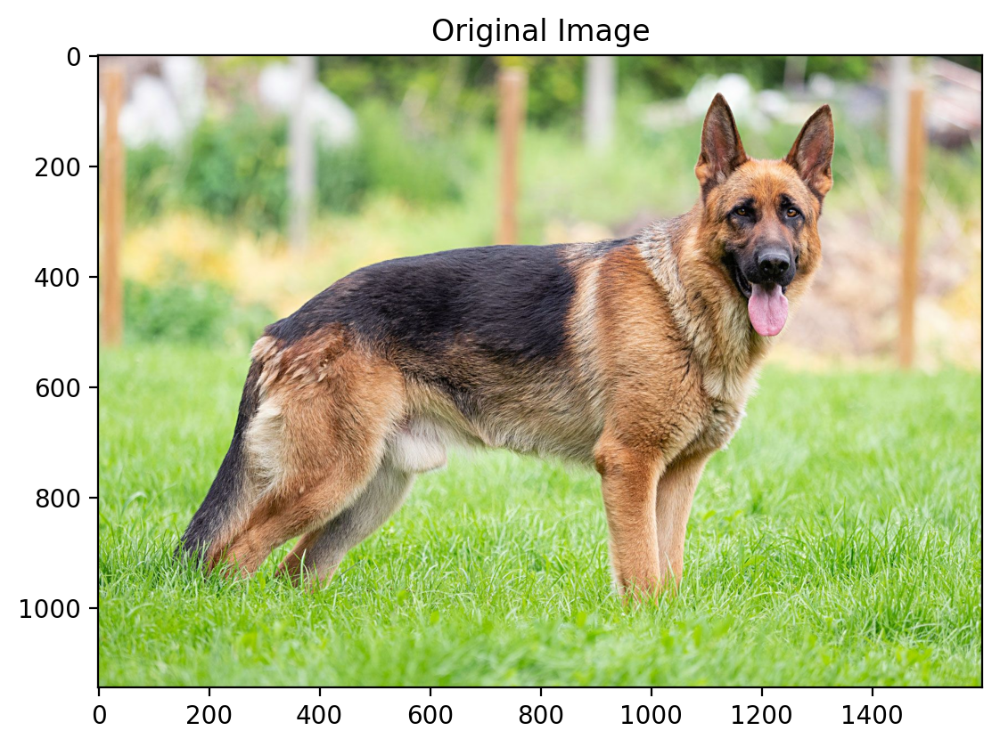

Cropped image shape: (300, 300, 3)


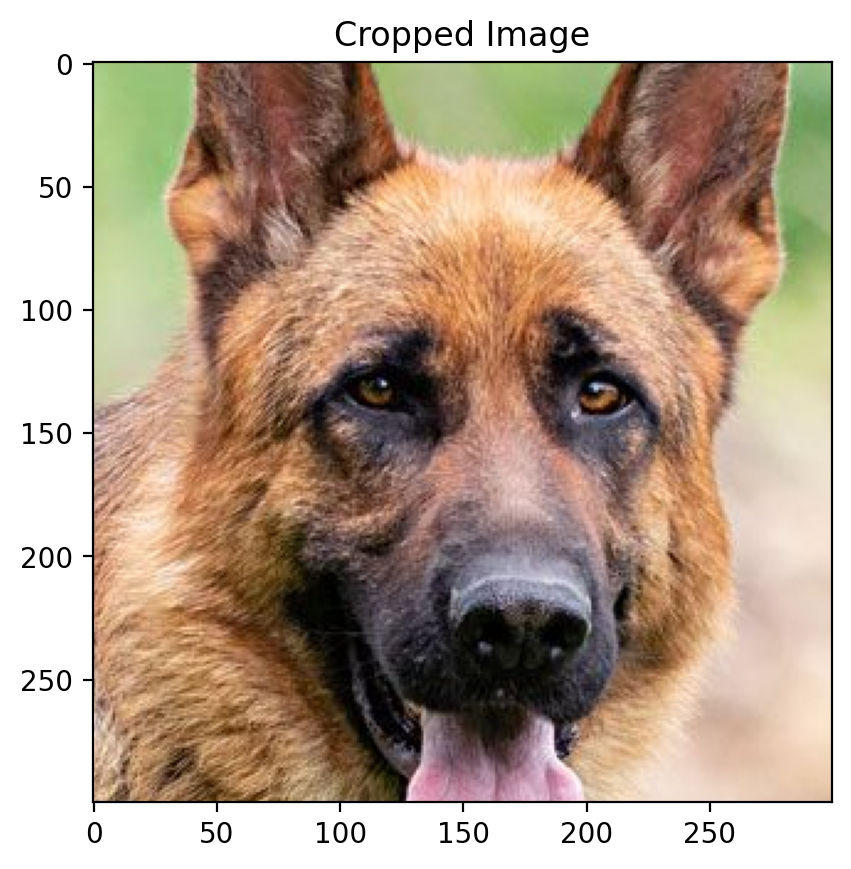

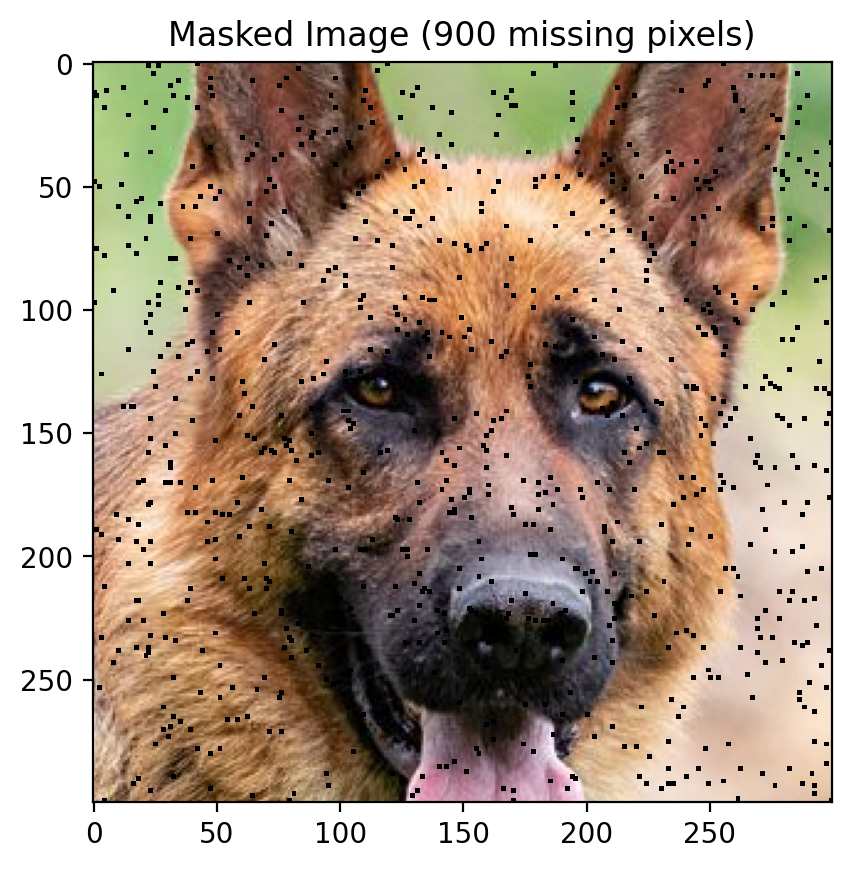

Channel 0, Epoch 0/1000, Loss: 99.1616439819336
Channel 0, Epoch 100/1000, Loss: 3.493560791015625
Channel 0, Epoch 200/1000, Loss: 0.22856850922107697
Channel 0, Epoch 300/1000, Loss: 0.05194399505853653
Channel 0, Epoch 400/1000, Loss: 0.02923724800348282
Channel 0, Epoch 500/1000, Loss: 0.020231949165463448
Channel 0, Epoch 600/1000, Loss: 0.015079912729561329
Channel 0, Epoch 700/1000, Loss: 0.01263870857656002
Channel 0, Epoch 800/1000, Loss: 0.011201770976185799
Channel 0, Epoch 900/1000, Loss: 0.010126069188117981
Channel 1, Epoch 0/1000, Loss: 97.9743423461914
Channel 1, Epoch 100/1000, Loss: 3.456756353378296
Channel 1, Epoch 200/1000, Loss: 0.23706208169460297
Channel 1, Epoch 300/1000, Loss: 0.04784611612558365
Channel 1, Epoch 400/1000, Loss: 0.02549530193209648
Channel 1, Epoch 500/1000, Loss: 0.018825525417923927
Channel 1, Epoch 600/1000, Loss: 0.01506317313760519
Channel 1, Epoch 700/1000, Loss: 0.012694509699940681
Channel 1, Epoch 800/1000, Loss: 0.011030727066099644


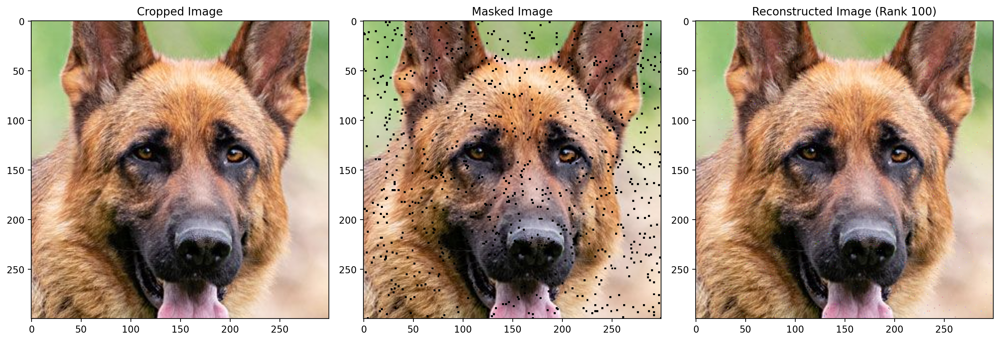

RMSE (for missing pixels): 0.13918818318005216
PSNR (for missing pixels): 17.12795267921296 dB


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from PIL import Image

# Load the color image
response = requests.get("https://cdn.britannica.com/79/232779-050-6B0411D7/German-Shepherd-dog-Alsatian.jpg")
img = Image.open(BytesIO(response.content)).convert('RGB')
img = np.array(img) / 255.0  # Normalize pixel values to [0, 1]
print(f"Original image shape: {img.shape}")

# Display the original image
plt.imshow(img)
plt.title("Original Image")
plt.axis('on')
plt.show()

# Crop the image with valid coordinates
# Ensure the cropping coordinates are within the image dimensions
left, upper, right, lower = 1050, 150, 1350, 450   # Adjust these coordinates for a larger crop
right = min(right, img.shape[1])  # Ensure the crop doesn't go out of bounds
lower = min(lower, img.shape[0])  # Ensure the crop doesn't go out of bounds

cropped_img = Image.fromarray((img * 255).astype(np.uint8)).crop((left, upper, right, lower))
cropped_img = np.array(cropped_img) / 255.0  # Normalize again after cropping
print(f"Cropped image shape: {cropped_img.shape}")

# Display the cropped image
plt.imshow(cropped_img)
plt.title("Cropped Image")
plt.axis('on')
plt.show()

# Mask 900 random pixels for each channel
def mask_image_with_nan(image, num_missing=900):
    """
    Randomly mask a certain number of pixels in the image by setting them to NaN.
    """
    masked_image = image.copy()
    m, n, c = masked_image.shape
    total_pixels = m * n
    flat_indices = np.random.choice(total_pixels, num_missing, replace=False)
    mask = np.zeros((m, n), dtype=bool).reshape(-1)
    mask[flat_indices] = True
    mask = mask.reshape((m, n))
    masked_image[mask] = np.nan
    return masked_image, mask

masked_img, mask = mask_image_with_nan(cropped_img, 900)

# Display the masked image
plt.imshow(masked_img)
plt.title("Masked Image (900 missing pixels)")
plt.axis('on')
plt.show()

# Matrix Factorization on each channel separately
def matrix_factorization_with_mask_color(R, mask, r, lr=0.005, epochs=1000):
    """
    Perform matrix factorization on a color image with missing pixels using gradient descent.
    """
    m, n, c = R.shape
    W_list = []
    H_list = []
    loss_history = []

    for channel in range(c):
        R_channel = R[:, :, channel]
        mask_channel = mask

        # Initialize matrices
        W = torch.randn(m, r, requires_grad=True, device=device)
        H = torch.randn(r, n, requires_grad=True, device=device)

        optimizer = torch.optim.Adam([W, H], lr=lr)

        # Replace NaN values with 0 for computation, but use the mask to ignore them in loss
        R_tensor = torch.tensor(np.nan_to_num(R_channel), dtype=torch.float32, device=device)
        mask_tensor = torch.tensor(~mask_channel, dtype=torch.float32, device=device)  # Invert mask to use as weights (1 for known pixels)

        for epoch in range(epochs):
            optimizer.zero_grad()
            R_hat = torch.mm(W, H)
            # Calculate loss only over known pixels
            loss = torch.mean((R_hat * mask_tensor - R_tensor * mask_tensor) ** 2)  # Mean Squared Error
            loss.backward()
            optimizer.step()

            loss_history.append(loss.item())
            if epoch % 100 == 0:
                print(f"Channel {channel}, Epoch {epoch}/{epochs}, Loss: {loss.item()}")

        W_list.append(W)
        H_list.append(H)

    return W_list, H_list, loss_history

# Ensure device is set (CPU or GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Apply matrix factorization for each channel
r = 100  # Adjust this value as necessary
W_list, H_list, loss_history = matrix_factorization_with_mask_color(masked_img, mask, r, lr=0.01, epochs=1000)

# Reconstruct the image for each channel
reconstructed_img = np.zeros_like(cropped_img)
for channel in range(cropped_img.shape[2]):
    W = W_list[channel]
    H = H_list[channel]
    reconstructed_channel = torch.mm(W, H).detach().cpu().numpy()
    reconstructed_img[:, :, channel] = reconstructed_channel

# Fill the missing pixels in the original masked image
reconstructed_img_with_missing = masked_img.copy()
for channel in range(cropped_img.shape[2]):
    reconstructed_img_with_missing[:, :, channel][np.isnan(masked_img[:, :, channel])] = reconstructed_img[:, :, channel][np.isnan(masked_img[:, :, channel])]

# Display the original, masked, and reconstructed images side by side
fig, ax = plt.subplots(1, 3, figsize=(15, 5))

# Cropped image
ax[0].imshow(cropped_img)
ax[0].set_title("Cropped Image")
ax[0].axis('on')

# Masked image
ax[1].imshow(masked_img)
ax[1].set_title("Masked Image")
ax[1].axis('on')

# Reconstructed image
ax[2].imshow(reconstructed_img_with_missing)
ax[2].set_title(f"Reconstructed Image (Rank {r})")
ax[2].axis('on')

plt.tight_layout()
plt.show()

# Calculate RMSE and PSNR for the missing pixels
def calculate_rmse_psnr_for_missing(original, reconstructed, mask):
    """
    Calculate RMSE and PSNR metrics for the reconstructed image, but only for the missing pixels.
    """
    missing_pixels = mask
    mse = np.mean((original[missing_pixels] - reconstructed[missing_pixels]) ** 2)
    rmse = np.sqrt(mse)

    if rmse == 0:
        psnr = float('inf')
    else:
        L = 1.0  # Max pixel value in normalized image (since the image is normalized to [0, 1])
        psnr = 20 * np.log10(L / rmse)

    return rmse, psnr

# Recalculate RMSE and PSNR only for the missing pixels
rmse_missing, psnr_missing = calculate_rmse_psnr_for_missing(cropped_img, reconstructed_img_with_missing, mask)

# Report RMSE and PSNR for the missing pixels
print(f"RMSE (for missing pixels): {rmse_missing}")
print(f"PSNR (for missing pixels): {psnr_missing} dB")


dog.jpg exists
torch.Size([3, 1144, 1600])


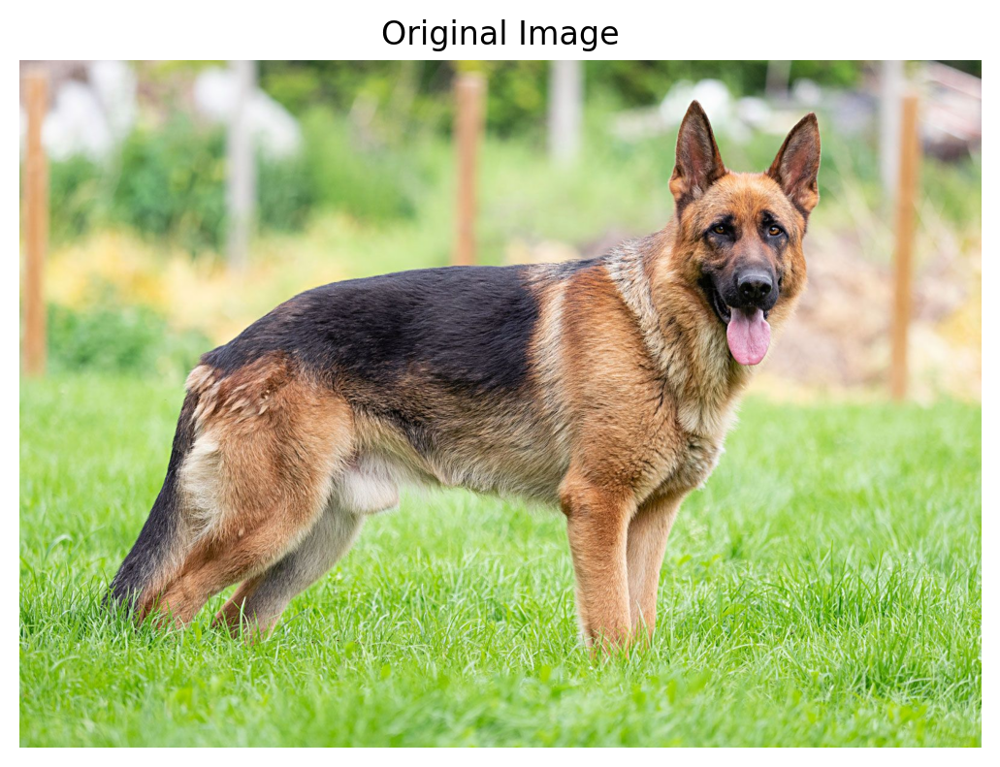

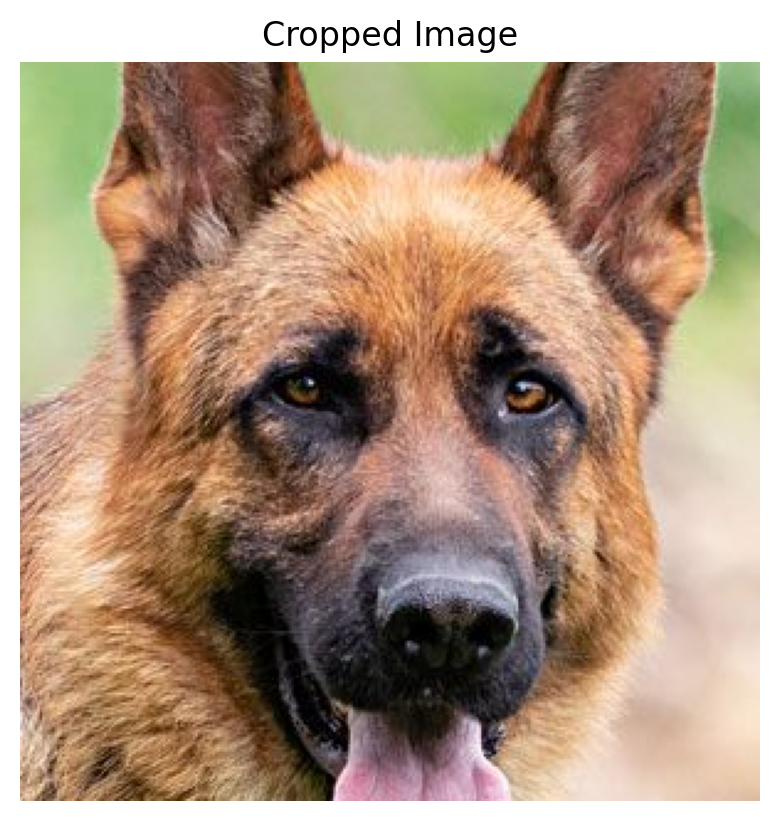

3 300 300


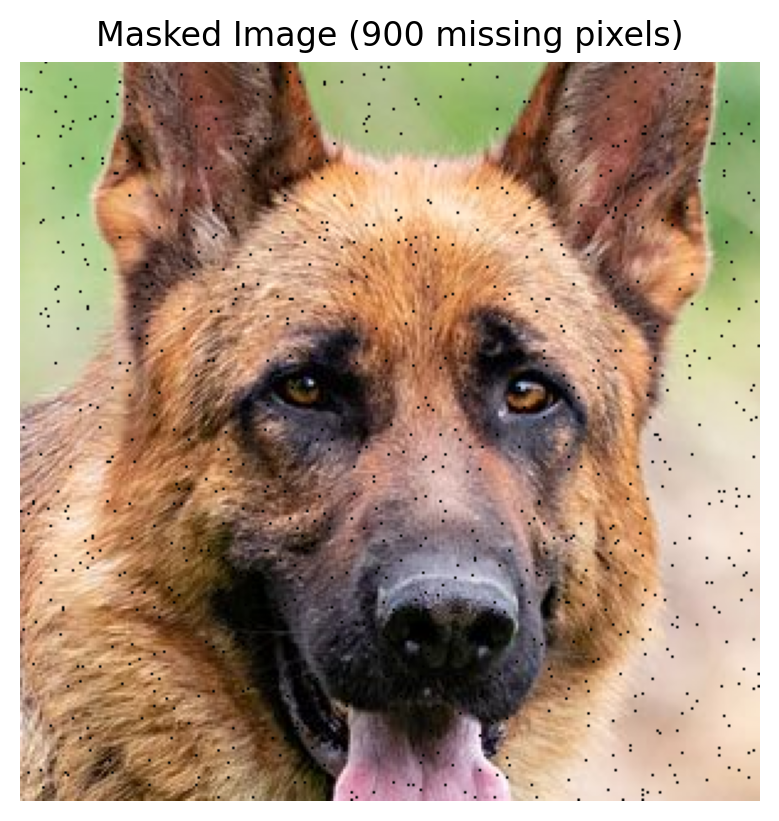

Epoch 0 loss: 0.337759
Epoch 100 loss: 0.054432
Epoch 200 loss: 0.028533
Epoch 300 loss: 0.021927
Epoch 400 loss: 0.017391
Epoch 500 loss: 0.013989
Epoch 600 loss: 0.011373
Epoch 700 loss: 0.009336
Epoch 800 loss: 0.007741
Epoch 900 loss: 0.006490
Epoch 1000 loss: 0.005508
Epoch 1100 loss: 0.004739
Epoch 1200 loss: 0.004138
Epoch 1300 loss: 0.003668
Epoch 1400 loss: 0.003302
Epoch 1500 loss: 0.003018
Epoch 1600 loss: 0.002796
Epoch 1700 loss: 0.002624
Epoch 1800 loss: 0.002490
Epoch 1900 loss: 0.002385
Epoch 2000 loss: 0.002303
Epoch 2100 loss: 0.002238
Epoch 2200 loss: 0.002186
Epoch 2300 loss: 0.002143
Epoch 2400 loss: 0.002109


RMSE (Masked Image Reconstruction): 0.35355567855715814
PSNR (Masked Image Reconstruction): 57.16164726944308


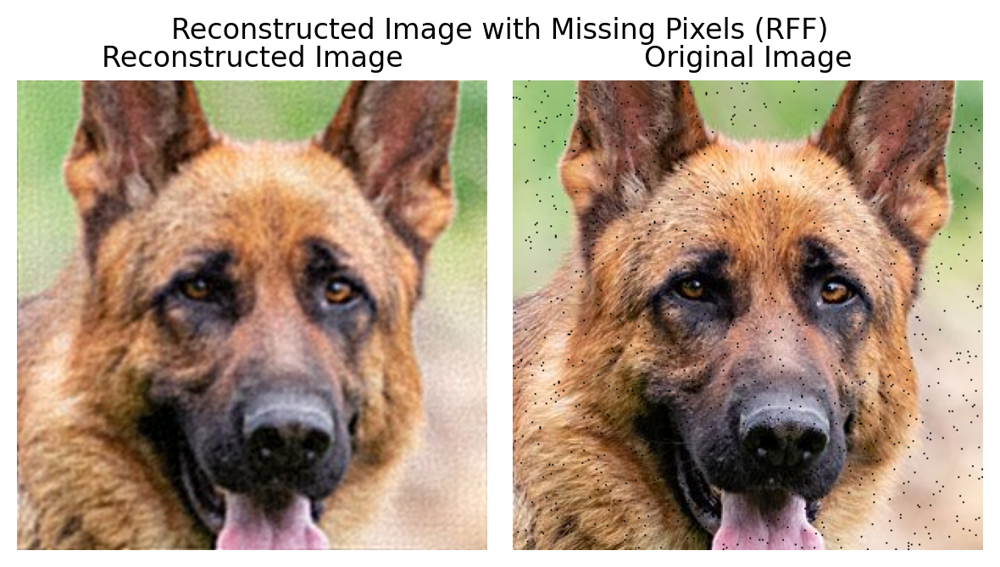

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

import numpy as np
import pandas as pd
import torch.nn as nn
import torch.nn.functional as F

# Remove all the warnings
import warnings
warnings.filterwarnings('ignore')

# Set env CUDA_LAUNCH_BLOCKING=1
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Retina display
%config InlineBackend.figure_format = 'retina'

try:
    from einops import rearrange
except ImportError:
    %pip install einops
    from einops import rearrange

if os.path.exists('dog.jpg'):
    print('dog.jpg exists')
else:
    !wget https://cdn.britannica.com/79/232779-050-6B0411D7/German-Shepherd-dog-Alsatian.jpg -O dog.jpg

# Load and visualize the original image
img = torchvision.io.read_image("dog.jpg")
print(img.shape)
plt.imshow(rearrange(img, 'c h w -> h w c').numpy())
plt.title("Original Image")
plt.axis('off')
plt.show()

# Min-Max scale the image to [0, 1]
from sklearn import preprocessing

scaler_img = preprocessing.MinMaxScaler().fit(img.reshape(-1, 1))
img_scaled = scaler_img.transform(img.reshape(-1, 1)).reshape(img.shape)
img_scaled = torch.tensor(img_scaled).to(device)

# Crop the image for reconstruction task
crop = torchvision.transforms.functional.crop(img_scaled.cpu(), 150, 1050, 300, 300)
plt.imshow(rearrange(crop, 'c h w -> h w c').cpu().numpy())
plt.title("Cropped Image")
plt.axis('off')
plt.show()

crop = crop.to(device)
num_channels, height, width = crop.shape
print(num_channels, height, width)

# Create coordinate map
def create_coordinate_map(img):
    num_channels, height, width = img.shape
    w_coords = torch.arange(width).repeat(height, 1)
    h_coords = torch.arange(height).repeat(width, 1).t()
    w_coords = w_coords.reshape(-1)
    h_coords = h_coords.reshape(-1)
    X = torch.stack([h_coords, w_coords], dim=1).float().to(device)
    Y = rearrange(img, 'c h w -> (h w) c').float()
    return X, Y

dog_X, dog_Y = create_coordinate_map(crop)

# Min-Max scale X coordinates
scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(dog_X.cpu())
dog_X_scaled = torch.tensor(scaler_X.transform(dog_X.cpu())).to(device).float()

# Function to create RFF features
def create_rff_features(X, num_features, sigma):
    from sklearn.kernel_approximation import RBFSampler
    rff = RBFSampler(n_components=num_features, gamma=1/(2 * sigma**2))
    X = rff.fit_transform(X.cpu().numpy())
    return torch.tensor(X, dtype=torch.float32).to(device)

# Linear model
class LinearModel(nn.Module):
    def __init__(self, in_features, out_features):
        super(LinearModel, self).__init__()
        self.linear = nn.Linear(in_features, out_features)

    def forward(self, x):
        return self.linear(x)

# Training function
def train(net, lr, X, Y, epochs, verbose=True):
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=lr)
    for epoch in range(epochs):
        optimizer.zero_grad()
        outputs = net(X)
        loss = criterion(outputs, Y)
        loss.backward()
        optimizer.step()
        if verbose and epoch % 100 == 0:
            print(f"Epoch {epoch} loss: {loss.item():.6f}")
    return loss.item()

# Function to plot original and reconstructed images
def plot_reconstructed_and_original_image(original_img, net, X, title=""):
    num_channels, height, width = original_img.shape
    net.eval()
    with torch.no_grad():
        outputs = net(X)
        outputs = outputs.reshape(height, width, num_channels)
    fig = plt.figure(figsize=(6, 4))
    gs = gridspec.GridSpec(1, 2, width_ratios=[1, 1])

    ax0 = plt.subplot(gs[0])
    ax1 = plt.subplot(gs[1])

    ax0.imshow(outputs.cpu())
    ax0.set_title("Reconstructed Image")

    ax1.imshow(original_img.cpu().permute(1, 2, 0))
    ax1.set_title("Original Image")

    for a in [ax0, ax1]:
        a.axis("off")

    fig.suptitle(title, y=0.9)
    plt.tight_layout()

# RMSE calculation function
def RMSE(original, reconstructed):
    mse = np.mean((original - reconstructed) ** 2)
    return np.sqrt(mse)

# PSNR calculation function
def calculate_psnr(original, reconstructed, rmse):
    max_pixel_value = 255.0
    return 20 * np.log10(max_pixel_value / rmse) if rmse != 0 else float('inf')

# Function to mask random pixels
def mask_random_pixels(img, num_missing_pixels=900):
    num_channels, height, width = img.shape
    total_pixels = height * width
    mask_indices = np.random.choice(total_pixels, num_missing_pixels, replace=False)
    mask = np.ones(total_pixels)
    mask[mask_indices] = 0
    mask = mask.reshape(height, width)
    masked_img = img.clone()
    for i in range(num_channels):
        masked_img[i] *= torch.tensor(mask, dtype=torch.float32, device=img.device)
    return masked_img, mask

# Mask 900 pixels in the cropped image
masked_img, mask = mask_random_pixels(crop, num_missing_pixels=900)

# Plot masked image
plt.imshow(rearrange(masked_img, 'c h w -> h w c').cpu().numpy())
plt.title("Masked Image (900 missing pixels)")
plt.axis('off')
plt.show()

# Create RFF features for masked image
X_rff_masked = create_rff_features(dog_X_scaled, 16050, 0.008)

# Train the model on the masked image
net_masked = LinearModel(X_rff_masked.shape[1], 3)
net_masked.to(device)
train(net_masked, 0.005, X_rff_masked, dog_Y, 2500)

# Plot the reconstructed image
plot_reconstructed_and_original_image(masked_img, net_masked, X_rff_masked, title="Reconstructed Image with Missing Pixels (RFF)")

# Calculate RMSE and PSNR for the reconstruction
with torch.no_grad():
    reconstructed_output_masked = net_masked(X_rff_masked).reshape(masked_img.shape)

rmse_masked = RMSE(masked_img.cpu().numpy(), reconstructed_output_masked.cpu().numpy())
psnr_masked = calculate_psnr(masked_img.cpu().numpy(), reconstructed_output_masked.cpu().numpy(), rmse_masked)

print("RMSE (Masked Image Reconstruction):", rmse_masked)
print("PSNR (Masked Image Reconstruction):", psnr_masked)


For the Given Image, We observe the reconstruction using Random Fourier Features (RFF) and Linear Regression to be better than reconstruction using Matrix Factorisation on comparing the PSNR.